In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import PIL                      # Python Imaging Library( for image operations)
import tensorflow as tf         # Deep learning library(allow to create neural network)
import matplotlib.pyplot as plt # for basic ploting

In [4]:
image_fb_hernia = PIL.Image.open(r"/kaggle/input/foreign-body-hernia-detection-in-animals/DataSet Hernia Detection/train/foreign_body_hernia/foreign_body_hernia_original_1.jpg_050bfaba-bfb5-4552-bb02-e1fc6471ea20.jpg")


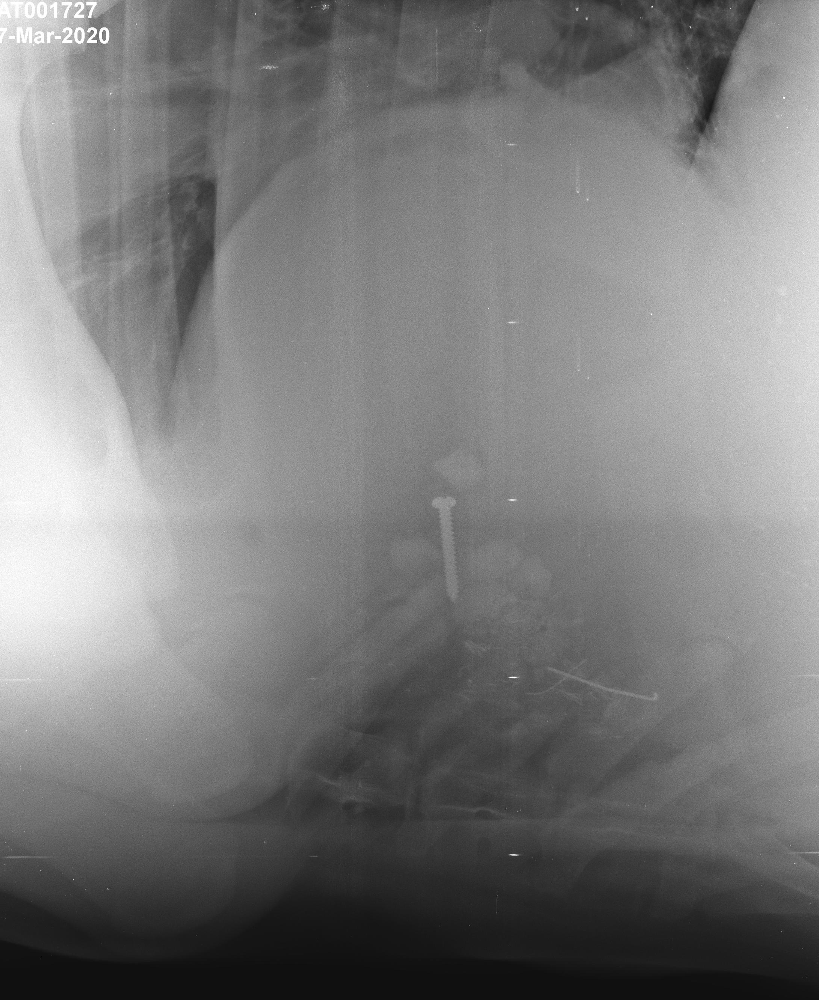

In [5]:
image_fb_hernia

In [6]:
image_normal = PIL.Image.open(r"/kaggle/input/foreign-body-hernia-detection-in-animals/DataSet Hernia Detection/train/normal/normal_original_1.jpg_032c568d-e8c4-4eb6-9135-b839a4bdbb8a.jpg")

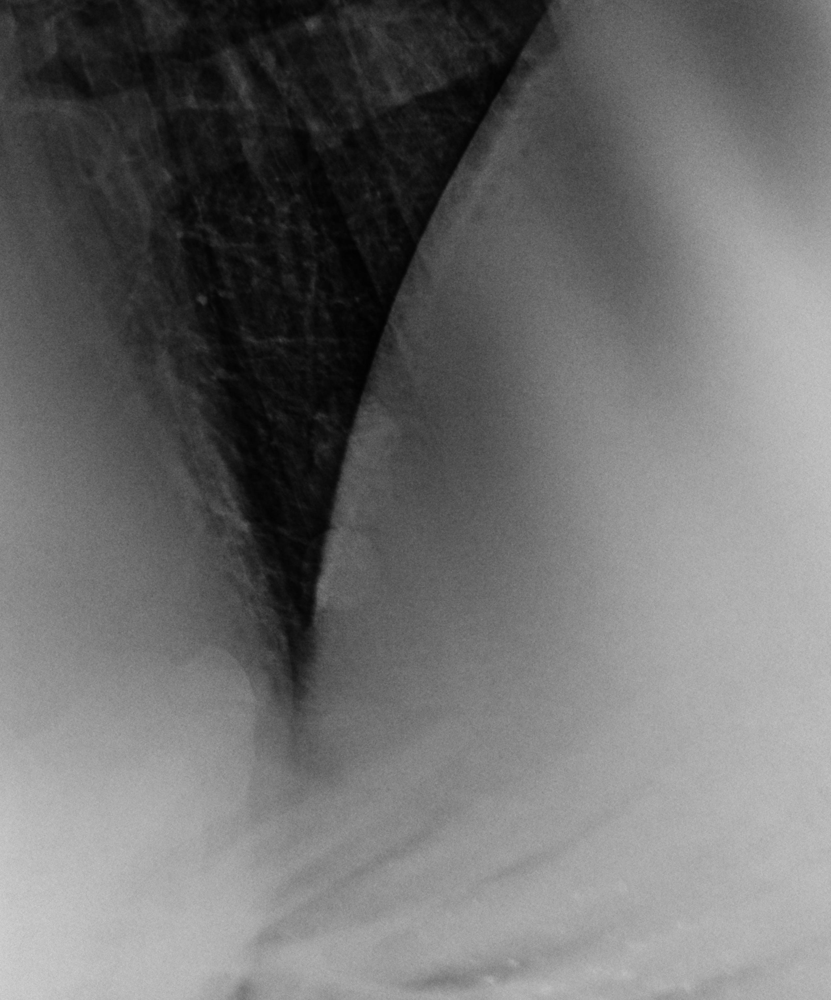

In [7]:
image_normal

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [9]:
training_dir = r"/kaggle/input/foreign-body-hernia-detection-in-animals/DataSet Hernia Detection/train"

training_generator = ImageDataGenerator(rescale = 1/255)

data_train = training_generator.flow_from_directory(training_dir ,class_mode='binary', target_size=(224,224))

Found 500 images belonging to 2 classes.


In [10]:
validation_dir = r"/kaggle/input/foreign-body-hernia-detection-in-animals/DataSet Hernia Detection/validation"

validation_generator = ImageDataGenerator(rescale = 1/255)

data_valid = validation_generator.flow_from_directory(validation_dir ,class_mode='binary', target_size=(224,224))

Found 8 images belonging to 2 classes.


In [11]:
testing_dir = r"/kaggle/input/foreign-body-hernia-detection-in-animals/DataSet Hernia Detection/test"

testing_generator = ImageDataGenerator(rescale = 1/255)

data_test = testing_generator.flow_from_directory(testing_dir ,class_mode='binary', target_size=(224,224))

Found 6 images belonging to 2 classes.


In [13]:
model = tf.keras.Sequential([tf.keras.layers.Input(shape=(224,224,3)),
                             tf.keras.layers.Conv2D(32, (3,3) , activation="relu"),
                             tf.keras.layers.MaxPooling2D(2,2),
                             tf.keras.layers.Conv2D(64,(3,3), activation="relu"),
                             tf.keras.layers.MaxPooling2D(2,2),
                             tf.keras.layers.Conv2D(128,(3,3), activation="relu"),
                             tf.keras.layers.MaxPooling2D(2,2),
                             tf.keras.layers.Conv2D(256,(3,3), activation="relu"),
                             tf.keras.layers.MaxPooling2D(2,2),
                             tf.keras.layers.Conv2D(512,(3,3), activation="relu"),
                             tf.keras.layers.MaxPooling2D(2,2),
                             tf.keras.layers.Flatten(),
                             tf.keras.layers.Dense(256, activation="relu"),
                             tf.keras.layers.Dense(1, activation='sigmoid')])

In [14]:
model.summary()  

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 10, 10, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,845,889 (18.49 MB)

 Trainable params: 4,845,889 (18.49 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss="binary_crossentropy",metrics=["acc"])

In [17]:
history = model.fit(data_train ,epochs=6 , validation_data=data_valid)

Epoch 1/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 46s 3s/step - acc: 0.4795 - loss: 0.7147 - val_acc: 0.5000 - val_loss: 0.6939
Epoch 2/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - acc: 0.4603 - loss: 0.6940 - val_acc: 0.5000 - val_loss: 0.6951
Epoch 3/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - acc: 0.4838 - loss: 0.6930 - val_acc: 0.5000 - val_loss: 0.6931
Epoch 4/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - acc: 0.4944 - loss: 0.6924 - val_acc: 0.5000 - val_loss: 0.6918
Epoch 5/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - acc: 0.5829 - loss: 0.6418 - val_acc: 0.6250 - val_loss: 0.9880
Epoch 6/6
16/16 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - acc: 0.8064 - loss: 0.3863 - val_acc: 0.3750 - val_loss: 1.7610


In [18]:
model.evaluate(data_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step - acc: 0.8333 - loss: 0.5389


[0.5389072299003601, 0.8333333134651184]

In [19]:
predictions=model.predict(data_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


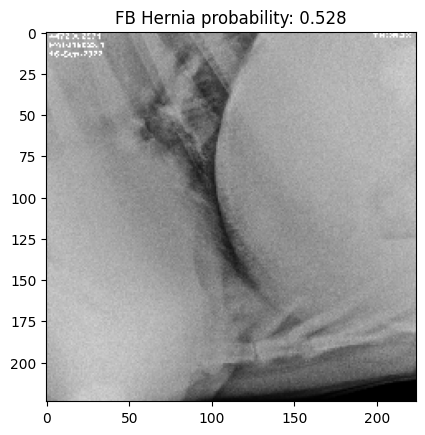

Image 1: FB Hernia probability = 0.528


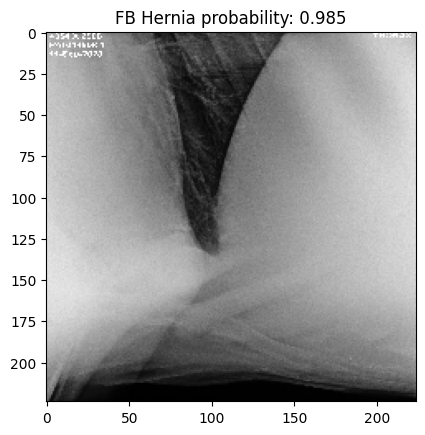

Image 2: FB Hernia probability = 0.985


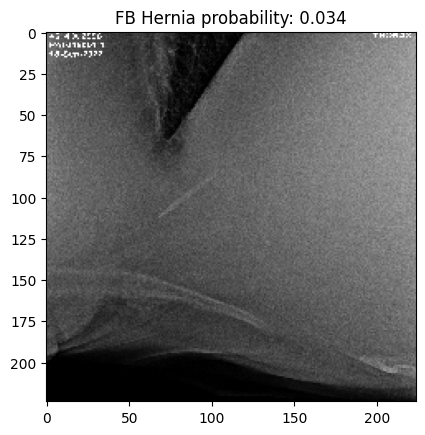

Image 3: FB Hernia probability = 0.034


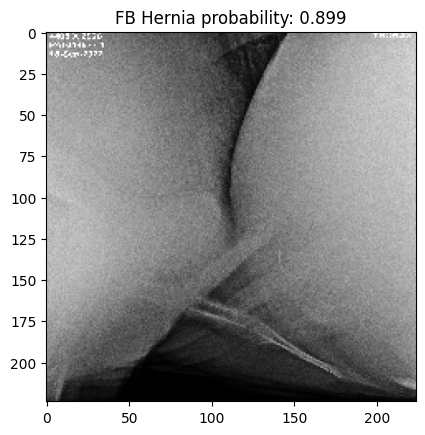

Image 4: FB Hernia probability = 0.899


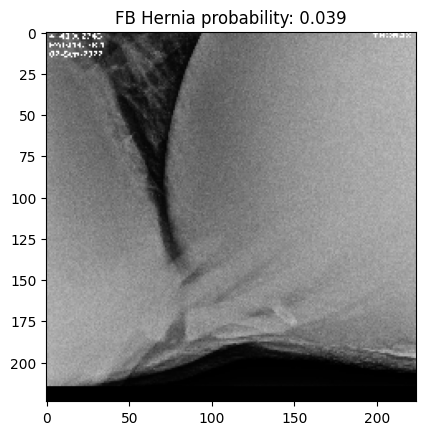

Image 5: FB Hernia probability = 0.039


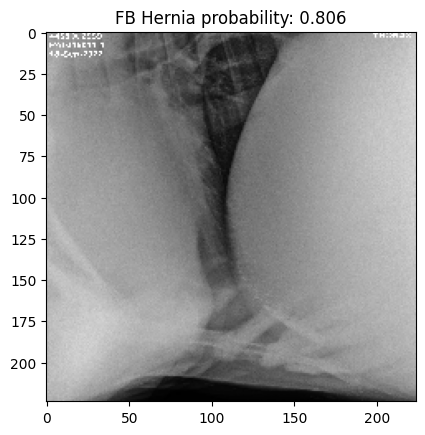

Image 6: FB Hernia probability = 0.806


In [20]:
images, labels = next(data_test)

predictions = model.predict(images)

for i in range(6):
    plt.imshow(images[i])
    plt.title(f"FB Hernia probability: {round(float(predictions[i][0]),3)}")
    plt.show()
    print(f"Image {i+1}: FB Hernia probability = {round(float(predictions[i][0]),3)}")